# Polynomial-kernel-based SVM
the specified parameters of SVM: **$C = 10,\ p=2$**

In [1]:
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
plt.style.use('ggplot')

import cvxopt
import cvxopt.solvers

from utility import *

In [2]:
# step 1: data setting(see ./utility.set_positive_and_negative_data())

iris_data = np.loadtxt('../dataset/iris.txt')
iris_data = iris_data[50:]

positive_data, negative_data = set_positive_and_negative_data(iris_data, [2, 3])

In [3]:
# step 2: split the data in training data and test data(see ./utility.get_training_and_test_data())

x_train, x_test, y_train, y_test, y_train_for_plot = get_training_and_test_data(positive_data, negative_data)

In [4]:
# step 3: get alpha and bias(see ./svm.PolynomialSVM())

from svm import PolynomialSVM

polynomial_svm = PolynomialSVM()
polynomial_svm.fit(x_train, y_train)

alpha = polynomial_svm.alpha
bias = polynomial_svm.bias

print('alpha:')
for index in range(len(alpha)):
    print('    {}'.format(round(alpha[index][0], 4)))

print('bias:\n    {}'.format(round(bias[0, 0], 4)))

alpha:
    0.0
    0.0
    3.8295
    0.0
    0.0
    0.0
    9.4708
    0.0
    0.0
    0.0
    0.0
    0.0
    0.0
    0.0
    0.0
    0.0
    0.0
    0.0
    0.0
    0.0
    10.0
    0.0
    3.8295
    0.0
    0.0
    0.0
    0.0
    0.0
    0.0
    0.0
    0.0
    10.0
    0.0
    0.0
    0.0
    0.0
    0.0
    0.0
    0.0
    0.0
    0.0
    0.0
    0.0
    0.0
    10.0
    0.0
    0.0
    0.0
    7.1297
    0.0
bias:
    13.7334


In [5]:
# step 4: get accuracy(see ./svm.RBFSVM().evaluate())

accuracy = polynomial_svm.evaluate(x_test, y_test)
print('Accuracy is: {}%'.format(accuracy))

Accuracy is: 94.0%


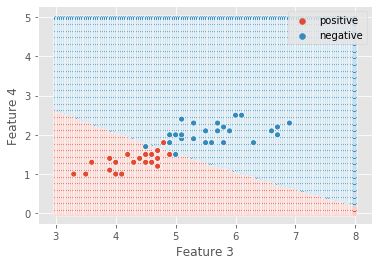

In [6]:
# step 5: plotting(see ./utility.plot_binary_class_area_and_2d_data())

plot_binary_class_area_and_2d_data(polynomial_svm, x_train, y_train_for_plot)

In [7]:
# step 6, 7: cross validation and average accuracy(see ./utility.cross_validation())

average_accuracy = cross_validation('polynomial_svm', x_train, x_test, y_train, y_test, c=10, p=2)

print('Average accuracy is: {}%'.format(average_accuracy))

Average accuracy is: 94.0%


Average accuracy is: 94.0% when p is 4
--------------------
Average accuracy is: 92.0% when p is 6
--------------------


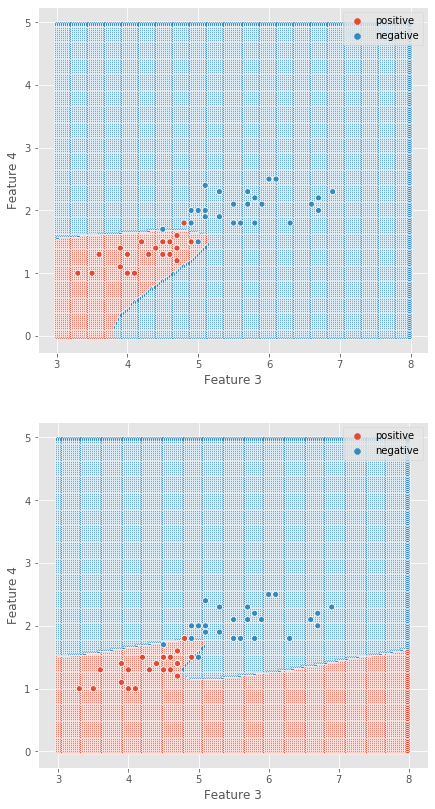

In [8]:
# step 8: plotting hyperplane and data in different sigma

p = [4, 6]

plt.figure(figsize=(7, 14))

for index in range(len(p)):
    polynomial_svm = PolynomialSVM(p=p[index])
    polynomial_svm.fit(x_train, y_train)

    plt.subplot(len(p), 1, index + 1)
    plot_binary_class_area_and_2d_data(polynomial_svm, x_train, y_train_for_plot)

    average_accuracy = cross_validation('polynomial_svm', x_train, x_test, y_train, y_test, p=p[index])
    print('Average accuracy is: {}% when p is {}\n{}'.format(average_accuracy, p[index], '-' * 20))